In [12]:
from rhythm_can.constants import *
from rhythm_can.utils import *
%matplotlib inline

print("DRUM_CLASSES:", DRUM_CLASSES)
print("# of drum instruments:", nb_notes)

print("dimentionality of random input z:", len_input)
print("resolution of one bar:", resolution*4) # how many grids in one bar
print("length of rhythm pattern to be generated:", len_seq, "beats" )


DRUM_CLASSES: ['Kick', 'Snare', 'Hi-hat closed', 'Hi-hat open', 'Low Tom', 'High Tom', 'Cymbal', 'Clap/Cowbell', 'Rim']
# of drum instruments: 9
dimentionality of random input z: 100
resolution of one bar: 16
length of rhythm pattern to be generated: 32 beats


In [14]:
import numpy as np

matrices_onsets = np.load("./data/matrices_drum_gm_clean_no_fill.npz")['onsets']
matrices_velos = np.load("./data/matrices_drum_gm_clean_no_fill.npz")['velocities']
matrices_offsets = np.load("./data/matrices_drum_gm_clean_no_fill.npz")['offsets']
matrices_genres = np.load("./data/matrices_drum_gm_clean_no_fill.npz")['genre_ids']
matrices_drums = matrices_velos
GENRES           = np.load("./data/matrices_drum_gm_clean_no_fill.npz")['genres']
NB_GENRES = len(GENRES)

print("Genres", GENRES)
print("# of Genres", NB_GENRES)
print(matrices_onsets.shape)

Genres ['techno' 'house' 'dnb' 'jungle' 'downtempo' 'trance' 'garage' 'old_skool'
 'breakbeat']
# of Genres 9
(1686, 32, 9)


## Loading pretrained

In [2]:
import torch
import os

In [3]:
from collections import OrderedDict
def convert_state_dict(state_dict):
    if not next(iter(state_dict)).startswith("module."):
        return state_dict  # abort if dict is not a DataParallel model_state
    new_state_dict = OrderedDict()
    for k, v in state_dict.items():
        name = k[7:]  # remove `module.`
        new_state_dict[name] = v
    return new_state_dict

In [7]:
generator_dataparallel = package['generator']
generator_state_dict = convert_state_dict(generator_dataparallel)  

In [8]:
pretrained_model_path = os.path.join('pretrain/conditioned_gan_LSTM/saves/d_loss0.2428_g_loss4.6774_Epoch1000.pth')
# pretrained_model_path = os.path.join('ckpt/conditioned_gan_fill/saves/d_loss0.3968_g_loss2.1787_Epoch300.pth')

package = torch.load(pretrained_model_path)

In [9]:
import importlib
MODEL = importlib.import_module("pretrain.conditioned_gan_LSTM.model")

# MODEL = importlib.import_module("ckpt.conditioned_gan_fill.model")
discriminator,generator = MODEL.get_model(NB_GENRES = package["NB_GENRES"],
                                            noise_len= package["noise_len"],
                                            len_seq= package["len_seq"],
                                            nb_notes=package["nb_notes"],
                                             kernal =package["kernal"]
                                         )

In [10]:
generator.load_state_dict(generator_state_dict)

<All keys matched successfully>

## Let's make music

### Testing AI


techno


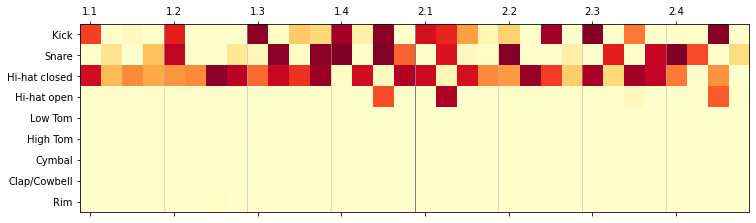

house


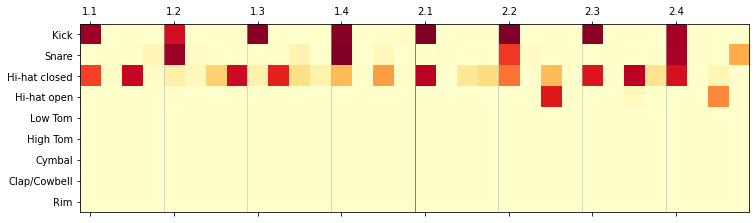

In [21]:
# Testing AI
for i in range(2):
    print(GENRES[i])
    #The model need generate at least 2 batches
    noise = np.random.normal(0.0, 1, size=(200)).reshape(2,100)

    noise = torch.FloatTensor(noise)
    label = torch.LongTensor([i,i])

    drum_fake = generator(noise,label)
    drum1 = drum_fake[0].data.numpy()
    
    plot_drum_matrix(drum1)
    play_drum_matrix(drum1)

### Testing human made

house


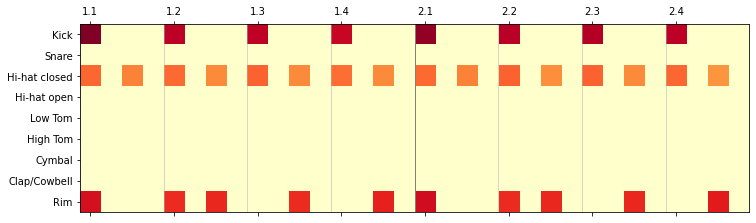

house


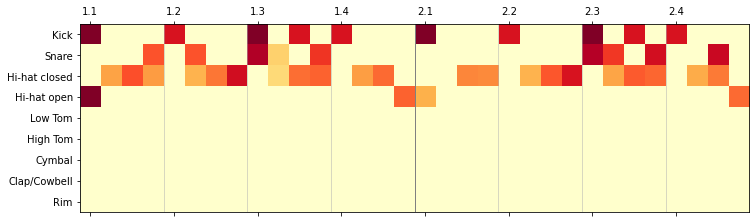

In [19]:
# Testing human made
import random
from scipy.io import wavfile
from midi2audio import FluidSynth
style = 1
for a in range(2):
    i = style
    print(GENRES[i])
    temp = np.where(matrices_genres == i)[0]
    index = random.choice(temp)
    drum = matrices_drums[index]
    
#     audio_data = play_drum_matrix(mat = np.squeeze(drum_generated))
    
    
    plot_drum_matrix(drum)
    data = play_drum_matrix(drum)
    
    
    
    #     print(data)

# Generating and Save

In [29]:
import pretty_midi
import random
from IPython.display import Audio
from scipy.io import wavfile

def play_drum_matrix(mat, offsets=None, tempo=120.0):
    # generate audio
    audio_data = get_audio_from_drum_matrix(mat, offsets=offsets, tempo=tempo)
    display(Audio(audio_data, rate=44100))
    return audio_data

def get_audio_from_drum_matrix(velocities, offsets=None, tempo=120.):
    pm = pretty_midi.PrettyMIDI(initial_tempo=tempo) # midi object
    pm_inst = pretty_midi.Instrument(0, is_drum=True) # midi instrument
    
    timestep = (60./tempo) / 4. # duration of a 16th note
    offset_unit = timestep / 2. # max offset == 32nd note
    
    for position, timeslot in enumerate(velocities):
        for inst, onset in enumerate(timeslot):
            if onset > 0.:
                note_number = DRUM_MIDI_MAP[inst]
                velocity = int(onset * 127.)
                
                offset = 0
                if offsets is not None:
                    offset = offsets[position, inst] * offset_unit

                start = timestep * position + offset
                end = timestep * (position + 0.5) + offset # duration doesn't matter much for rhythm track
                
                # create a midi note
                note = pretty_midi.Note(velocity=velocity, pitch=note_number, start=start, end=end)
                pm_inst.notes.append(note)
    pm.instruments.append(pm_inst)

    # midi -> audio
    audio_data = pm.fluidsynth()
    return audio_data




techno
MAN_made


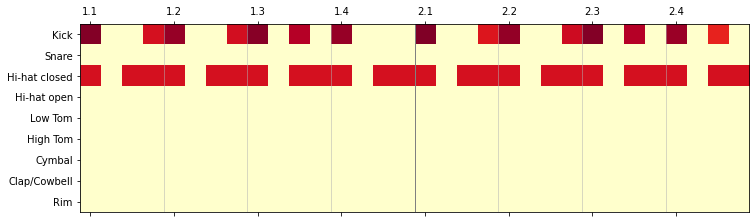

techno
AI_made


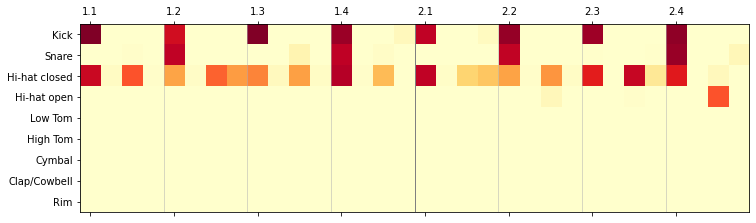

house
MAN_made


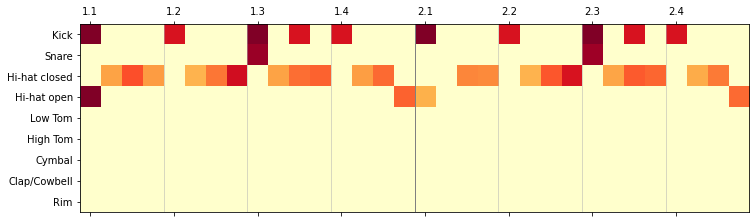

house
AI_made


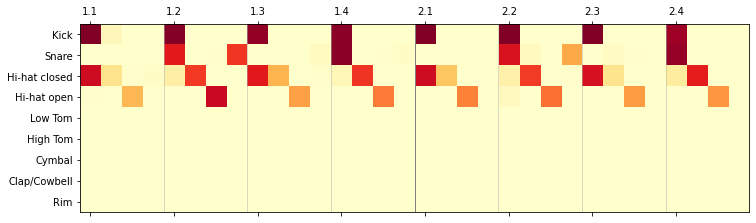

dnb
MAN_made


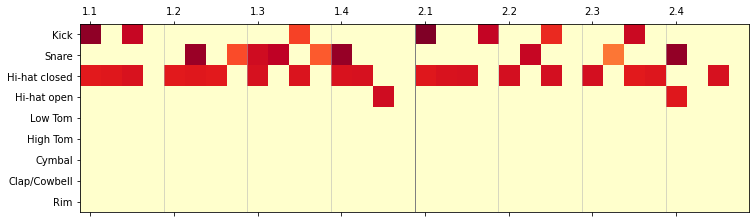

dnb
AI_made


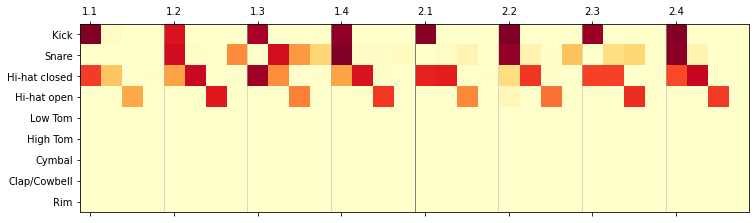

jungle
MAN_made


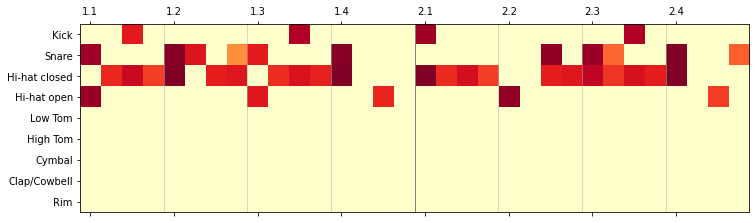

jungle
AI_made


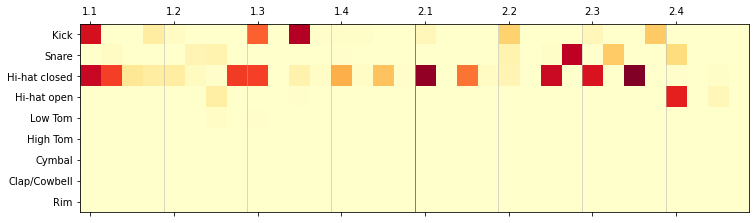

downtempo
MAN_made


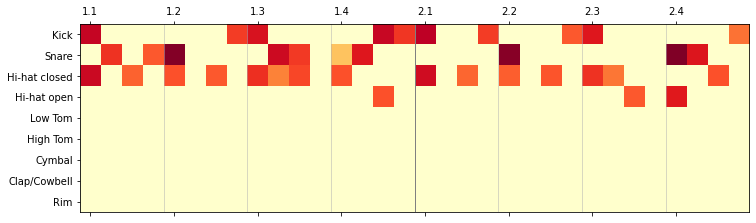

downtempo
AI_made


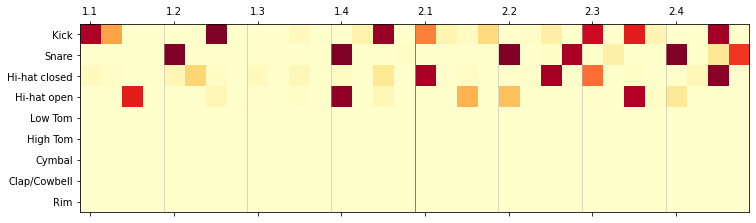

trance
MAN_made


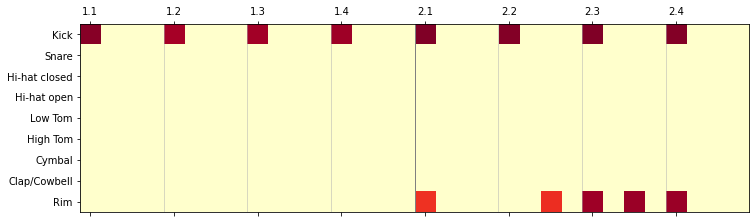

trance
AI_made


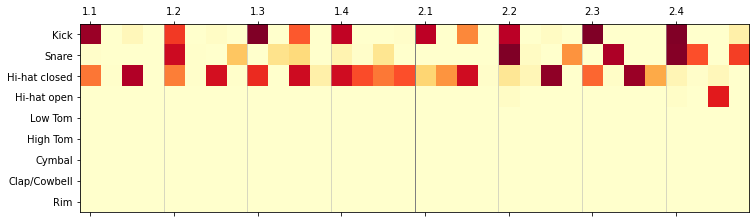

garage
MAN_made


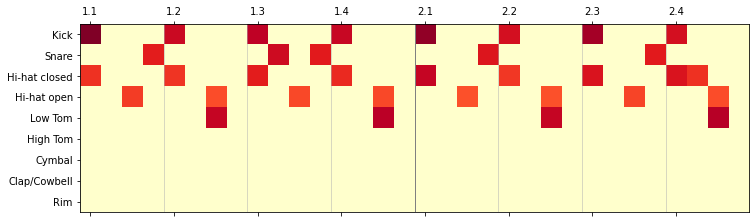

garage
AI_made


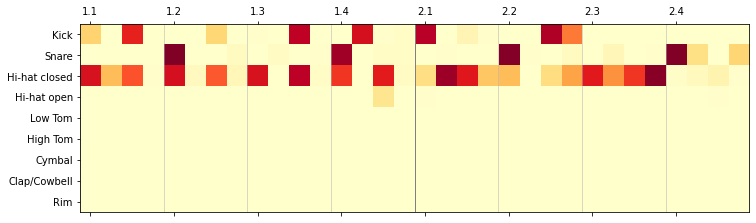

old_skool
MAN_made


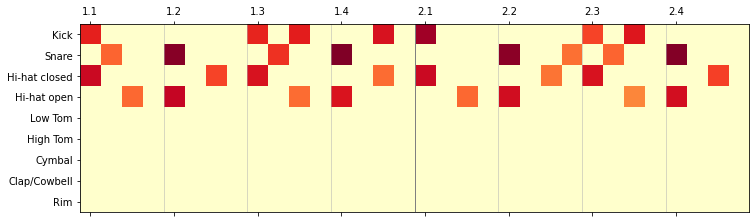

old_skool
AI_made


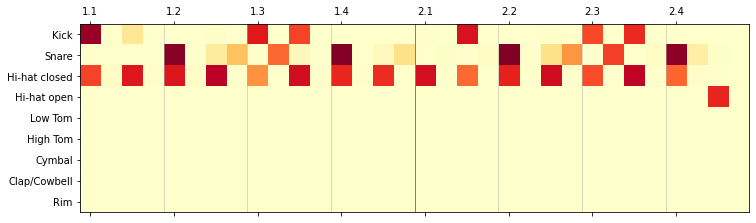

breakbeat
MAN_made


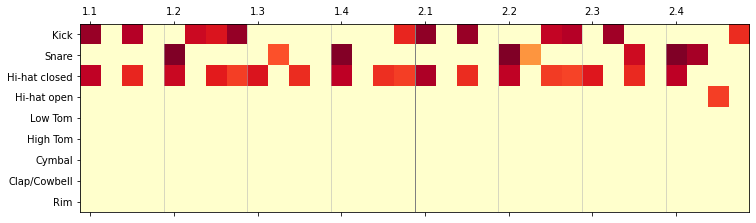

breakbeat
AI_made


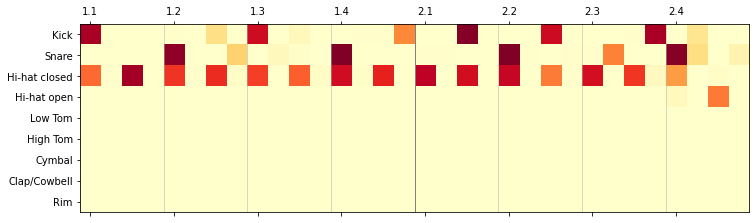

In [32]:
number_sample_man = 1
number_sample_ai = 1

from pathlib import Path
root = 'Man'+str(number_sample_man)+'AI'+str(number_sample_ai)
Path(root).mkdir(exist_ok=True)
for i in range(len(GENRES)):
    
    root_style = os.path.join(root, GENRES[i]) 
    Path(root_style).mkdir(exist_ok=True)
    
    made = "man_made"
    root_style_made = os.path.join(root_style, made) 
    Path(root_style_made).mkdir(exist_ok=True)

    for j in range(number_sample_man):
        print(GENRES[i])
        temp = np.where(matrices_genres == i)[0]
        index = random.choice(temp)
        drum = matrices_drums[index]
        print("MAN_made")

        plot_drum_matrix(drum)
        
        audio_data = play_drum_matrix(drum)

        current_path = os.path.join(root_style_made, "%s_%d_%s.wav") 
        wavfile.write(current_path % (GENRES[i], j, made), 44100, audio_data)



    made = "ai_made"
    root_style_made = os.path.join(root_style, made) 
    Path(root_style_made).mkdir(exist_ok=True)

    for j in range(number_sample_ai):
        print(GENRES[i])
        noise = np.random.normal(0.0, 1, size=(200)).reshape(2,100)

        noise = torch.FloatTensor(noise)
        label = torch.LongTensor((2,1)).fill_(i)

        drum_fake = generator(noise,label)
        drum1 = drum_fake[0].data.numpy()
        print("AI_made")
        plot_drum_matrix(drum1)
        audio_data = play_drum_matrix(np.squeeze(drum1))
        current_path = os.path.join(root_style_made, "%s_%d_%s.wav") 
        wavfile.write(current_path % (GENRES[i], j, made), 44100, audio_data)
        
        
        
        
        